In [17]:
# Installing the liabraries
import nltk
import pandas as pd
import os
from nltk.tokenize import word_tokenize
import numpy as np

In [18]:
# Reading the dataset
dataset = pd.read_csv('D:/MSc_AI/MLT/coursework/assignment/dataset/trainingset.txt', delimiter='\t')
test_dataset = pd.read_csv('D:/MSc_AI/MLT/coursework/assignment/dataset/testset.txt', delimiter='\t')

In [3]:
dataset

,tweetId,tweetText,userId,imageId(s),username,timestamp,label
0,263046056240115712,¿Se acuerdan de la película: “El día después d...,21226711,sandyA_fake_46,iAnnieM,Mon Oct 29 22:34:01 +0000 2012,fake
1,262995061304852481,@milenagimon: Miren a Sandy en NY! Tremenda i...,192378571,sandyA_fake_09,CarlosVerareal,Mon Oct 29 19:11:23 +0000 2012,fake
2,262979898002534400,"Buena la foto del Huracán Sandy, me recuerda a...",132303095,sandyA_fake_09,LucasPalape,Mon Oct 29 18:11:08 +0000 2012,fake
3,262996108400271360,Scary shit #hurricane #NY http://t.co/e4JLBUfH,241995902,sandyA_fake_29,Haaaaarryyy,Mon Oct 29 19:15:33 +0000 2012,fake
4,263018881839411200,My fave place in the world #nyc #hurricane #sa...,250315890,sandyA_fake_15,princess__natt,Mon Oct 29 20:46:02 +0000 2012,fake
...,...,...,...,...,...,...,...
14272,443231991593304064,@BobombDom *slaps TweetDeck with the PigFish h...,2179310905,pigFish_01,Da_Vault_Hunter,Tue Mar 11 03: 48: 36 +0000 2014,fake
14273,443086239127076865,New Species of Fish found in Brazil or just Re...,254843101,pigFish_01,DjSituation_RC,Mon Mar 10 18: 09: 26 +0000 2014,fake
14274,442978105238753280,What do we call this? #pigFISH http: \/\/t.co\...,2367553228,pigFish_01,Vivo1Vuyo,Mon Mar 10 10: 59: 45 +0000 2014,fake
14275,442753479782989824,Pigfish ? E dopo il pescecane c'è il pesce mai...,603120231,pigFish_01,CosimoTarta,Sun Mar 09 20: 07: 10 +0000 2014,fake


In [4]:
test_dataset

,tweetId,tweetText,userId,imageId(s),username,timestamp,label
0,578854927457349632,kereeen RT @Shyman33: Eclipse from ISS.... htt...,70824972,eclipse_01,peay_s,Fri Mar 20 09:45:43 +0000 2015,fake
1,578874632670953472,Absolutely beautiful! RT @Shyman33: Eclipse fr...,344707006,eclipse_01,JaredUcanChange,Fri Mar 20 11:04:02 +0000 2015,fake
2,578891261353984000,“@Shyman33: Eclipse from ISS.... http://t.co/C...,224839607,eclipse_01,tpjp1231,Fri Mar 20 12:10:06 +0000 2015,fake
3,578846612312748032,Eclipse from ISS.... http://t.co/En87OtvsU6,134543073,eclipse_01,Shyman33,Fri Mar 20 09:12:41 +0000 2015,fake
4,578975333841551360,@ebonfigli: Éclipse vue de l'ISS... Autre chos...,1150728872,eclipse_01,Epimethee_,Fri Mar 20 17:44:11 +0000 2015,fake
...,...,...,...,...,...,...,...
3750,578433150071775232,Un présentateur de la ZDF confesse avoir truqu...,257551211,varoufakis_1,Cdt_Sylvestre,Thu Mar 19 05:49:44 +0000 2015,fake
3751,578433646597656576,"Oh les kleine menteurs ""@CorineBarella: Un pré...",27575883,varoufakis_1,damomarc,Thu Mar 19 05:51:42 +0000 2015,fake
3752,578486910491996160,Este es el programa de ZDF en el que confirman...,2049211,varoufakis_1,javierpascual,Thu Mar 19 09:23:21 +0000 2015,fake
3753,578505023912591360,11.34 - wir haben FAST Mittag ▶ Riesen Verwirr...,262222386,varoufakis_1,aotto1968_2,Thu Mar 19 10:35:20 +0000 2015,fake


## Exploring the Dataset

In [3]:
# Sample code to checking for missing values
missing_values = dataset.isnull().sum()
print("Missing Values:")
print(missing_values)

Missing Values:
tweetId       0
tweetText     0
userId        0
imageId(s)    0
username      0
timestamp     0
label         0
dtype: int64


In [19]:
min_tweet_len = 280 # Minimun tweet text

In [71]:
# An empty list to store the indices of rows with long tweet text
long_tweet_indices = []

# Iterate through each row in the dataset
for index, row in dataset.iterrows():
    tweet_text = row['tweetText']

    # Check if the length of the tweet text is longer than the specified threshold
    if len(tweet_text) > min_tweet_len:
        long_tweet_indices.append(index)

# Print the indices of rows with long tweet text
print("Indices of rows with long tweet text:")
print(long_tweet_indices)

Indices of rows with long tweet text:
[571, 1803, 2516, 2642, 2675, 4192, 4380, 6571, 6573, 8638, 9186, 9418, 9953, 11401, 13233]


In [132]:
dataset.iloc[571].tweetText

'In the driving rain of Hurricane Sandy, soldiers continue to stand guard at the Tomb of the Unknown Soldier http://t.co/amV005ZP\t350583423\tsandyA_fake_31\tDancerCJW\tMon Oct 29 18:40:11 +0000 2012\tfake\n263057124198871040\t@MonicaCrowley @claytonwagar: Tomb of the Unknowns during sandy http://t.co/punXpb7q”&lt;---pic has to be fake!  O said we don\'t use bayonets!\t872436710\tsandyA_fake_02\tErikConatser\tMon Oct 29 23:18:00 +0000 2012\tfake\n262983017616773120\tSoldiers at the Tomb of the Unknown Soldier this morning during Sandy\'s wrath. http://t.co/PQtwjDXc\t41662611\tsandyA_fake_31\tmweir1\tMon Oct 29 18:23:32 +0000 2012\tfake\n262976764941316096\t«@OMGFacts Amazing soldiers standing at the Tomb of the Unknown Soldier during hurricane Sandy. http://t.co/leQT6mG0»\t95248708\tsandyA_fake_03\tscottssargent\tMon Oct 29 17:58:41 +0000 2012\tfake\n263051485196218368\t“@LoMendez12: Respect to these soldiers,despite hurricane sandy still remain protecting the sacred tomb of the unknow

In [133]:
word_to_count = 'http:'
word_count = dataset.iloc[571].str.lower().str.count(word_to_count.lower()).sum()
word_count

8.0

In [134]:
for i in long_tweet_indices:
    word_to_count = 'http:'
    word_count = dataset.iloc[571].str.lower().str.count(word_to_count.lower()).sum()
    print(word_count)

8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0


In [135]:
dataset.tweetId.value_counts()

264736470089216000    2
263351427320131584    2
263046056240115712    1
263019084772421632    1
263427804975206401    1
                     ..
263376004754583552    1
263029335877906432    1
262998664031649792    1
263029070210686977    1
442700377860104192    1
Name: tweetId, Length: 14275, dtype: int64

In [136]:
dataset.label.value_counts()

fake     6742
real     4921
humor    2614
Name: label, dtype: int64

## Detecting the Languages in the Tweets

In [137]:
!pip install langid

In [19]:
import langid

# Language detection using langid
def detect_language(text):
    lang, confidence = langid.classify(text)
    return lang, confidence

# Apply the language detection function to the 'tweetText' column
detected_language = dataset['tweetText'].apply(detect_language)

# Print the first few rows with detected languages
print(detected_language)

0         (es, -613.4434359073639)
1         (es, -295.2347836494446)
2         (es, -324.7970304489136)
3        (en, -23.151258945465088)
4        (en, -114.69223117828369)
                   ...            
14272    (en, -54.907326221466064)
14273     (zh, -424.1562194824219)
14274     (en, -69.89458537101746)
14275    (it, -122.06944799423218)
14276    (en, -127.71005845069885)
Name: tweetText, Length: 14277, dtype: object


In [54]:
unique_languages = detected_language.apply(lambda x: x[0]).unique()
print(unique_languages)

['es' 'en' 'pl' 'hr' 'la' 'rw' 'it' 'lt' 'ko' 'pt' 'fr' 'tr' 'nn' 'ky'
 'et' 'ru' 'ja' 'sk' 'ht' 'zh' 'qu' 'am' 'sr' 'id' 'sl' 'af' 'zu' 'nl'
 'jv' 'de' 'hu' 'ga' 'da' 'mn' 'sv' 'ar' 'eo' 'lo' 'ca' 'mt' 'mg' 'lb'
 'fi' 'br' 'no' 'an' 'cs' 'el' 'th' 'eu' 'he' 'sq' 'gl' 'ro' 'lv' 'sw'
 'tl' 'az' 'nb' 'be' 'kk' 'cy' 'oc' 'vi' 'xh' 'se' 'ku' 'bs' 'fa' 'or'
 'ur' 'si' 'km' 'mk' 'wa' 'ps' 'bn' 'mr' 'ms']


In [20]:
detected_language_test = test_dataset['tweetText'].apply(detect_language)

In [58]:
unique_languages_test = detected_language_test.apply(lambda x: x[0]).unique()
print(unique_languages)

['en' 'ko' 'fr' 'es' 'it' 'de' 'la' 'ja' 'pt' 'tr' 'br' 'zh' 'fi' 'nl'
 'id' 'ar' 'sl' 'hi' 'cy' 'ta' 'el' 'mg' 'ms' 'pl' 'te' 'ru' 'he' 'th'
 'eu' 'et' 'nn' 'ky' 'ur' 'qu' 'an' 'ps' 'lt' 'eo' 'gl' 'vi' 'si' 'fa'
 'ku' 'az' 'ga' 'lb' 'ug' 'cs']


In [21]:
# Map language codes to their full names
language_names = {
    'es': 'Spanish', 'en': 'English', 'pl': 'Polish', 'hr': 'Croatian', 'la': 'Latin', 'rw': 'Kinyarwanda',
    'it': 'Italian', 'lt': 'Lithuanian', 'ko': 'Korean', 'pt': 'Portuguese', 'fr': 'French', 'tr': 'Turkish',
    'nn': 'Norwegian Nynorsk', 'ky': 'Kyrgyz', 'et': 'Estonian', 'ru': 'Russian', 'ja': 'Japanese', 'sk': 'Slovak',
    'ht': 'Haitian Creole', 'zh': 'Chinese', 'qu': 'Quechua', 'am': 'Amharic', 'sr': 'Serbian', 'id': 'Indonesian',
    'sl': 'Slovenian', 'af': 'Afrikaans', 'zu': 'Zulu', 'nl': 'Dutch', 'jv': 'Javanese', 'de': 'German', 'hu': 'Hungarian',
    'ga': 'Irish', 'da': 'Danish', 'mn': 'Mongolian', 'sv': 'Swedish', 'ar': 'Arabic', 'eo': 'Esperanto', 'lo': 'Lao',
    'ca': 'Catalan', 'mt': 'Maltese', 'mg': 'Malagasy', 'lb': 'Luxembourgish', 'fi': 'Finnish', 'br': 'Breton',
    'no': 'Norwegian', 'an': 'Aragonese', 'cs': 'Czech', 'el': 'Greek', 'th': 'Thai', 'eu': 'Basque', 'he': 'Hebrew',
    'sq': 'Albanian', 'gl': 'Galician', 'ro': 'Romanian', 'lv': 'Latvian', 'sw': 'Swahili', 'tl': 'Tagalog', 'az': 'Azerbaijani',
    'nb': 'Norwegian Bokmål', 'be': 'Belarusian', 'kk': 'Kazakh', 'cy': 'Welsh', 'oc': 'Occitan', 'vi': 'Vietnamese',
    'xh': 'Xhosa', 'se': 'Northern Sami', 'ku': 'Kurdish', 'bs': 'Bosnian', 'fa': 'Persian', 'or': 'Oriya', 'ur': 'Urdu',
    'si': 'Sinhala', 'km': 'Khmer', 'mk': 'Macedonian', 'wa': 'Walloon', 'ps': 'Pashto', 'bn': 'Bengali', 'mr': 'Marathi',
    'ms': 'Malay'
}

In [22]:
# Create a new column for full language names
dataset['language_name'] = detected_language.apply(lambda x: language_names.get(x[0], 'Unknown'))
dataset_1 = dataset.copy()

In [142]:
dataset_1

,tweetId,tweetText,userId,imageId(s),username,timestamp,label,language_name
0,263046056240115712,¿Se acuerdan de la película: “El día después d...,21226711,sandyA_fake_46,iAnnieM,Mon Oct 29 22:34:01 +0000 2012,fake,Spanish
1,262995061304852481,@milenagimon: Miren a Sandy en NY! Tremenda i...,192378571,sandyA_fake_09,CarlosVerareal,Mon Oct 29 19:11:23 +0000 2012,fake,Spanish
2,262979898002534400,"Buena la foto del Huracán Sandy, me recuerda a...",132303095,sandyA_fake_09,LucasPalape,Mon Oct 29 18:11:08 +0000 2012,fake,Spanish
3,262996108400271360,Scary shit #hurricane #NY http://t.co/e4JLBUfH,241995902,sandyA_fake_29,Haaaaarryyy,Mon Oct 29 19:15:33 +0000 2012,fake,English
4,263018881839411200,My fave place in the world #nyc #hurricane #sa...,250315890,sandyA_fake_15,princess__natt,Mon Oct 29 20:46:02 +0000 2012,fake,English
...,...,...,...,...,...,...,...,...
14272,443231991593304064,@BobombDom *slaps TweetDeck with the PigFish h...,2179310905,pigFish_01,Da_Vault_Hunter,Tue Mar 11 03: 48: 36 +0000 2014,fake,English
14273,443086239127076865,New Species of Fish found in Brazil or just Re...,254843101,pigFish_01,DjSituation_RC,Mon Mar 10 18: 09: 26 +0000 2014,fake,Chinese
14274,442978105238753280,What do we call this? #pigFISH http: \/\/t.co\...,2367553228,pigFish_01,Vivo1Vuyo,Mon Mar 10 10: 59: 45 +0000 2014,fake,English
14275,442753479782989824,Pigfish ? E dopo il pescecane c'è il pesce mai...,603120231,pigFish_01,CosimoTarta,Sun Mar 09 20: 07: 10 +0000 2014,fake,Italian


In [23]:
test_dataset['language_name'] = detected_language_test.apply(lambda x: language_names.get(x[0], 'Unknown'))

In [61]:
test_dataset

,tweetId,tweetText,userId,imageId(s),username,timestamp,label,language_name
0,578854927457349632,kereeen RT @Shyman33: Eclipse from ISS.... htt...,70824972,eclipse_01,peay_s,Fri Mar 20 09:45:43 +0000 2015,fake,English
1,578874632670953472,Absolutely beautiful! RT @Shyman33: Eclipse fr...,344707006,eclipse_01,JaredUcanChange,Fri Mar 20 11:04:02 +0000 2015,fake,English
2,578891261353984000,“@Shyman33: Eclipse from ISS.... http://t.co/C...,224839607,eclipse_01,tpjp1231,Fri Mar 20 12:10:06 +0000 2015,fake,Korean
3,578846612312748032,Eclipse from ISS.... http://t.co/En87OtvsU6,134543073,eclipse_01,Shyman33,Fri Mar 20 09:12:41 +0000 2015,fake,English
4,578975333841551360,@ebonfigli: Éclipse vue de l'ISS... Autre chos...,1150728872,eclipse_01,Epimethee_,Fri Mar 20 17:44:11 +0000 2015,fake,French
...,...,...,...,...,...,...,...,...
3750,578433150071775232,Un présentateur de la ZDF confesse avoir truqu...,257551211,varoufakis_1,Cdt_Sylvestre,Thu Mar 19 05:49:44 +0000 2015,fake,French
3751,578433646597656576,"Oh les kleine menteurs ""@CorineBarella: Un pré...",27575883,varoufakis_1,damomarc,Thu Mar 19 05:51:42 +0000 2015,fake,French
3752,578486910491996160,Este es el programa de ZDF en el que confirman...,2049211,varoufakis_1,javierpascual,Thu Mar 19 09:23:21 +0000 2015,fake,Spanish
3753,578505023912591360,11.34 - wir haben FAST Mittag ▶ Riesen Verwirr...,262222386,varoufakis_1,aotto1968_2,Thu Mar 19 10:35:20 +0000 2015,fake,German


In [10]:
dataset_1.tweetText[14273]

'New Species of Fish found in Brazil or just Really good Photoshop??? What You Think? ������������ http: \\/\\/t.co\\/a6bG8mWcUs'

In [11]:
# Print the tweet ID and Tweets
for index, row in dataset_1.iterrows():
    print(f"Tweet Id: {row['tweetId']}")
    print(f"Tweet: {row['tweetText']}")
    print("\n")

Tweet Id: 263046056240115712
Tweet: ¿Se acuerdan de la película: “El día después de mañana”? Me recuerda a lo que está pasando con el huracán #Sandy. http://t.co/JQQeRPwN


Tweet Id: 262995061304852481
Tweet: @milenagimon: Miren a Sandy en NY!  Tremenda imagen del huracán. Parece el "Día de la Independencia 2" http://t.co/41jUweux REAL! RT.


Tweet Id: 262979898002534400
Tweet: Buena la foto del Huracán Sandy, me recuerda a la película Día de la Independencia #ID4 #Sandy  http://t.co/PTdAXABZ


Tweet Id: 262996108400271360
Tweet: Scary shit #hurricane #NY http://t.co/e4JLBUfH


Tweet Id: 263018881839411200
Tweet: My fave place in the world #nyc #hurricane #sandy #statueofliberty 🗽 http://t.co/Ex61doZk


Tweet Id: 263364439582060545
Tweet: 42nd #time #square #NYC #subway #hurricane http://t.co/daX5YY7X


Tweet Id: 262927032705490944
Tweet: Just in time for #halloween a photo of #hurricane #sandy #frankenstorm http://t.co/xquKB4VN


Tweet Id: 263321078884077568
Tweet: Crazy pic of #Hurri

Tweet Id: 263591608891625474
Tweet: #quit #smoking #angry #sandy יום רביעי בלי סיגריות. מתחילים להרגיש את התוצאות מעבר לים @ ייסורי ורתר הצעיר http://t.co/rEtfhSGB


Tweet Id: 263328613250785281
Tweet: Sembla una peli de por!! #Sandy #newyork #mamapor http://t.co/K97Tzi06


Tweet Id: 263279811148013568
Tweet: Нью-Йорк #Sandy\n\njrlara512's photo http://t.co/h5jclEwH


Tweet Id: 263040999591395328
Tweet: Esta foto de #Sandy sobre Manhattan me dejó :O http://t.co/brlZ5RFz


Tweet Id: 263124896450748418
Tweet: @FawazJ7: #Sandy #NYC الله الحافظ http://t.co/gkrPowJ8


Tweet Id: 263119753411960832
Tweet: #Sandy http://t.co/CLt2mrCr


Tweet Id: 263190528898764800
Tweet: Oración por #NYC 🙏 #sandy http://t.co/imuS1qF1


Tweet Id: 263627696553209856
Tweet: “@aparmisen: No sé si esta foto del temporal en NY es fake, pero es muy IMPACTANTE. #Sandy | http://t.co/2GKZ01OM” esta si es real! Jajajaj


Tweet Id: 263076074836074496
Tweet: Solo es una tormenta #Sandy hace temblar a #USA http://t.co/bUFNy

Tweet Id: 263013372516257792
Tweet: LMAO YO!!!! IM DONE!!! #Sandy #HurricaneSandy #Hurricane http://t.co/XLZY0dfv


Tweet Id: 263436826600153088
Tweet: You can come out and play now #statueofliberty. Thanks for sending @prabalgurung #sandy #hurricane http://t.co/I1zg0k7F


Tweet Id: 262987960163659777
Tweet: Miss Liberty is scared #Sandy #hurricane #scary http://t.co/lU3tFR1F


Tweet Id: 263009574074843137
Tweet: sandy we dont wont none!!! #sandy #storm #weather #Iphone #iponesia #nyc #nj #hurricane http://t.co/NfZjdCIY


Tweet Id: 263102842947129344
Tweet: Oh shit.  Lol #sandy #hurricane http://t.co/KfJq88W5


Tweet Id: 263182900902629376
Tweet: #hurricane #sandy #real #live #action http://t.co/dQPqGMCG


Tweet Id: 263132240215683072
Tweet: #hurricane #sandy http://t.co/ffevMIS3


Tweet Id: 263236458985435136
Tweet: Is it safe to come out yet? #Hurricane #sandy #HurricaneSandy #help #Statue of #Liberty #Pray for #EastCoast http://t.co/KM8RRaLr


Tweet Id: 263299543020478469
Tweet: The

Tweet Id: 263060300226502658
Tweet: Thinking about all those on the east coast! #staysafe #takecover #hurricanesandy http://t.co/6jmTkMfg


Tweet Id: 263007895493431297
Tweet: #hurricanesandy http://t.co/cZo44oO8


Tweet Id: 263051075374940162
Tweet: Ctfu #hurricanesandy http://t.co/hGVyjFrQ


Tweet Id: 263078795706265600
Tweet: So this is whats really going on in the #EastCoast #HurricaneSandy #Liars #Haha http://t.co/xfTF0a2z


Tweet Id: 263037149186764800
Tweet: Look at Lady Liberty hidin from me #HurricaneSandy bitch I will crush you lmfao http://t.co/1iMJhAps


Tweet Id: 263151595003445248
Tweet: #hurricanesandy http://t.co/MhOqpGpv


Tweet Id: 263085285544443904
Tweet: #superstorm #sandy #hurricanesandy #nyc #endoftheworld http://t.co/3eNAfqPo


Tweet Id: 263029889786056704
Tweet: I kno #HurricaneSandy is not a joke, but this was funny... http://t.co/HNufdBuK


Tweet Id: 263099640860250112
Tweet: #NY deserves it...lol #HurricaneSandy http://t.co/rDQfrGiJ


Tweet Id: 2631452188980

Tweet Id: 263270120762257409
Tweet: #HurricaneSandy #NewYork http://t.co/i6QA0cvz


Tweet Id: 263009756816478208
Tweet: Aah RT @byebye__blondie: Thinking of all those affected by #hurricaneSandy you and your families remain in our prayers! http://t.co/6F3DuFWU


Tweet Id: 262957617750634498
Tweet: #hurricanesandy #newyork #nyc http://t.co/ceYAJh0v


Tweet Id: 263000788639563777
Tweet: Praying for my brother during this #repost #hurricanesandy #fuckmothernature http://t.co/JxeZzEbm


Tweet Id: 263037998705287168
Tweet: Even #hurricanesandy  cant stop #teammerica http://t.co/lWEcA59K


Tweet Id: 263114817571799041
Tweet: Espetacular!!! #hurricanesandy #ny #thehuffingtonpost http://t.co/l9YP7MuV


Tweet Id: 263036534947737600
Tweet: Shit jus got real... #hurricanesandy http://t.co/n2PzbA98


Tweet Id: 263173095517483008
Tweet: No Way in or Out of Manhattan NY! #HurricaneSandy http://t.co/WYp4WHWL


Tweet Id: 263069328491020288
Tweet: Somebody let their shark out #HurricaneSandy #Frankenst

Tweet Id: 262985949603061760
Tweet: What hurricane Sandra done #ohshit #onthenews #sandy #sandyhurricane  #hurricanesandy  #legit http://t.co/W7b6hjp6


Tweet Id: 263667953046798336
Tweet: #hurricanesandy #jerseyshore http://t.co/29aJUVJz


Tweet Id: 263556343636578304
Tweet: Classy damage #hurricanesandy #hurricane #hurricanenyc #blackout #blackoutnyc #scarry #apocalypse #igdaily # http://t.co/joO0igDW


Tweet Id: 263327387998097408
Tweet: Eerie photo #hurricanesandy http://t.co/HTUqZj0q


Tweet Id: 263179244471984128
Tweet: Free trampoline anyone... #hurricanesandy #usa #trampoline #ohcrap http://t.co/KLI2xXGI


Tweet Id: 263154797392326656
Tweet: Get em sandy! #hurricanesandy #hurricane #sandy http://t.co/QI8BByXw


Tweet Id: 263037592994459648
Tweet: Shits Real!!! #HurricaneSandy http://t.co/WyKXo8JS


Tweet Id: 263110171130216448
Tweet: #hurricanesandy http://t.co/CBma5Sym


Tweet Id: 262980718144126977
Tweet: Prayers for my Yankee friends and Fam! #hurricanesandy #NJ #NY #VA #pra

Tweet Id: 265124888854032386
Tweet: What a pic! RT @DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/EPpYgwqT


Tweet Id: 265121164073005056
Tweet: “@DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/XASvWFFL”


Tweet Id: 265139674669019137
Tweet: “@DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/PHXuxXvv” wow


Tweet Id: 265117438071418880
Tweet: Wow!  #Sandy RT @DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/SD2BmfX7


Tweet Id: 265118894950322179
Tweet: Eep.  RT @DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/Xwogu2X7


Tweet Id: 265127005933170688
Tweet: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/6UKRY4LS


Tweet 



Tweet Id: 264532694283726848
Tweet: Unbelievable scene flying over #StatenIsland in an #NYPD helicopter. Those are not little toys! #Sandy @ABC http://t.co/MNSogBJE


Tweet Id: 264070412432969729
Tweet: Ils sont sympa ces new-yorkais (via @ppgarcia75 ) #Sandy http://t.co/jsP1IXsu


Tweet Id: 264943825863192576
Tweet: Hurricane A-rod #mlbmemes http://t.co/1cyx4OdM


Tweet Id: 264218974475145216
Tweet: This restores my faith in humanity. After Hurricane #Sandy... http://t.co/FWfPGkt6


Tweet Id: 264070146543464448
Tweet: Ils sont sympa ces new-yorkais (via @ppgarcia75 ) #Sandy http://t.co/jsP1IXsu


Tweet Id: 264111618319847426
Tweet: Dear Mainstream Media - Cuba is also affected by #Sandy http://t.co/YJqv8jNW


Tweet Id: 264540607484137472
Tweet: Unbelievable scene flying over #StatenIsland in an #NYPD helicopter. Those are not little toys! #Sandy @ABC http://t.co/MNSogBJE


Tweet Id: 264067503481815040
Tweet: l'entraide entre les New-Yorkais après #Sandy n'est pas une vue de l'esprit

Tweet Id: 510097606417334273
Tweet: @SenatorIsakson Johnny , How far do you think a gas can spread away from #ColumbianChemicals http://t.co/VQsOzbXk5y


Tweet Id: 510102015855194113
Tweet: I can’t get it! I had friends there / I lost many friends there. #DeadHorse  #ColumbianChemicals http://t.co/zFO8SlCZ1A


Tweet Id: 510090467535761408
Tweet: @/andreashaw07 Andrea, Explosion at #ColumbianChemicals! That’s really freaky news. http://t.co/JYJ1CHEoN4


Tweet Id: 510110087654817792
Tweet: You’re way too impudent. Well, it could be worse. #DeadHorse  #ColumbianChemicals http://t.co/w809oibKux


Tweet Id: 510093718339481600
Tweet: @SenDonnelly Joe, Are you kidding?? I saw the video #ColumbianChemicals and it looks like hell!!! What a nightmare! http://t.co/pfvf2nudoL


Tweet Id: 510106321287266304
Tweet: How could I believe this? Okay keep going that way, yep… #ColumbianChemicals http://t.co/ZFLiqJsVQY


Tweet Id: 510107233393577984
Tweet: Why is it happening? God damn it, do something! #

In [145]:
dataset_1[dataset_1['tweetId'] == 263010650517807104].index[0]

22

In [24]:
dataset_1['language_name'].to_csv('languages.txt', header=False, index=False, sep='\t')

## Tokenization 

In [25]:
from nltk.tokenize import word_tokenize

def tokenize_tweet(text):
    # Tokenize the text
    tokens = word_tokenize(text)
    
    # Remove links
    tokens = [token for token in tokens if token.isalnum()]
    tokens = [token for token in tokens if not token.startswith(('http', '//t.co/'))]

    return tokens
dataset_1['new_tweetText'] = dataset_1['tweetText'].apply(tokenize_tweet)
test_dataset['new_tweetText'] = test_dataset['tweetText'].apply(tokenize_tweet)

In [9]:
# Print the tokenized tweets
for index, row in dataset_1.iterrows():
    print(f"Original Tweet: {row['tweetText']}")
    print(f"Tokenized Tweet: {row['new_tweetText']}")
    print("\n")

Original Tweet: ¿Se acuerdan de la película: “El día después de mañana”? Me recuerda a lo que está pasando con el huracán #Sandy. http://t.co/JQQeRPwN
Tokenized Tweet: ['acuerdan', 'de', 'la', 'película', 'El', 'día', 'después', 'de', 'mañana', 'Me', 'recuerda', 'a', 'lo', 'que', 'está', 'pasando', 'con', 'el', 'huracán', 'Sandy']


Original Tweet: @milenagimon: Miren a Sandy en NY!  Tremenda imagen del huracán. Parece el "Día de la Independencia 2" http://t.co/41jUweux REAL! RT.
Tokenized Tweet: ['milenagimon', 'Miren', 'a', 'Sandy', 'en', 'NY', 'Tremenda', 'imagen', 'del', 'huracán', 'Parece', 'el', 'Día', 'de', 'la', 'Independencia', '2', 'REAL', 'RT']


Original Tweet: Buena la foto del Huracán Sandy, me recuerda a la película Día de la Independencia #ID4 #Sandy  http://t.co/PTdAXABZ
Tokenized Tweet: ['Buena', 'la', 'foto', 'del', 'Huracán', 'Sandy', 'me', 'recuerda', 'a', 'la', 'película', 'Día', 'de', 'la', 'Independencia', 'ID4', 'Sandy']


Original Tweet: Scary shit #hurricane 

Original Tweet: Amazing Picture!!! - Earlier today!! :-O #sandy http://t.co/S8Wr14Za
Tokenized Tweet: ['Amazing', 'Picture', 'Earlier', 'today', 'sandy']


Original Tweet: Shark on the road! #Unreal #Sandy http://t.co/QMh9Jx4z
Tokenized Tweet: ['Shark', 'on', 'the', 'road', 'Unreal', 'Sandy']


Original Tweet: #sharksinthestreet #reallife #lbi #sandy http://t.co/MnPLRtkw
Tokenized Tweet: ['sharksinthestreet', 'reallife', 'lbi', 'sandy']


Original Tweet: Sharks are swimming through the neighborhood because of #Sandy http://t.co/RMTFfIy2
Tokenized Tweet: ['Sharks', 'are', 'swimming', 'through', 'the', 'neighborhood', 'because', 'of', 'Sandy']


Original Tweet: Sharks swim freely at #NYC streets! #Sandy  http://t.co/fyuw0gaI
Tokenized Tweet: ['Sharks', 'swim', 'freely', 'at', 'NYC', 'streets', 'Sandy']


Original Tweet: #Sandy esta tarde sobre NYC. https://t.co/mGdNVgOZ …
Tokenized Tweet: ['Sandy', 'esta', 'tarde', 'sobre', 'NYC']


Original Tweet: It's getting real out there. Stay safe 

Original Tweet: Scared Stat­ue of Lib­er­ty #sandy “@jgpmolloy: @LanceUlanoff @inafried This one? http://t.co/l44DRowP”
Tokenized Tweet: ['Scared', 'of', 'sandy', 'jgpmolloy', 'LanceUlanoff', 'inafried', 'This', 'one']


Original Tweet: #sandy aterrorizando #newyorkcity http://t.co/D0MZqncN
Tokenized Tweet: ['sandy', 'aterrorizando', 'newyorkcity']


Original Tweet: Stunning images of #Frankenstorm from New York City #sandy http://t.co/jwxWA2Lg
Tokenized Tweet: ['Stunning', 'images', 'of', 'Frankenstorm', 'from', 'New', 'York', 'City', 'sandy']


Original Tweet: Ha! Here's another fake Statue of Liberty pic ... #sandy http://t.co/dg8QnZl1
Tokenized Tweet: ['Ha', 'Here', 'another', 'fake', 'Statue', 'of', 'Liberty', 'pic', 'sandy']


Original Tweet: #stormrolled @cybertheorist  @AnonyNewsNet #sandy #frankenstorm New Jersey FEMA Ghostbusters https://t.co/ZoAmH9eD
Tokenized Tweet: ['stormrolled', 'cybertheorist', 'AnonyNewsNet', 'sandy', 'frankenstorm', 'New', 'Jersey', 'FEMA', 'Ghostbust

Original Tweet: EXCLUSIVO: La Estatua de la Libertad está muy asustada con el paso del huracán Sandy por Nueva York. http://t.co/MPAArIaQ
Tokenized Tweet: ['EXCLUSIVO', 'La', 'Estatua', 'de', 'la', 'Libertad', 'está', 'muy', 'asustada', 'con', 'el', 'paso', 'del', 'huracán', 'Sandy', 'por', 'Nueva', 'York']


Original Tweet: #lol....Así esta la estatua d la libertad en NY#sandy go awayyyy!!!! http://t.co/JLMkjHnm
Tokenized Tweet: ['lol', 'Así', 'esta', 'la', 'estatua', 'd', 'la', 'libertad', 'en', 'NY', 'sandy', 'go', 'awayyyy']


Original Tweet: La estatua de la Libertad también espera al Huracán Sandy: http://t.co/ANddhBBq
Tokenized Tweet: ['La', 'estatua', 'de', 'la', 'Libertad', 'también', 'espera', 'al', 'Huracán', 'Sandy']


Original Tweet: “@borjateran: La Estatua de la Libertad en estos momentos. http://t.co/SH5f4z5V” #Sandy
Tokenized Tweet: ['borjateran', 'La', 'Estatua', 'de', 'la', 'Libertad', 'en', 'estos', 'momentos', 'Sandy']


Original Tweet: [Montaje] La tormenta Sandy 



Original Tweet: Another Shark Pic #HurricaneSandy smh... http://t.co/IZZXrj3C
Tokenized Tweet: ['Another', 'Shark', 'Pic', 'HurricaneSandy', 'smh']


Original Tweet: #hurricanesandy http://t.co/w9T4qxrM
Tokenized Tweet: ['hurricanesandy']


Original Tweet: Insane RT @itsWillyFerrell: An insane picture taken today of #HurricaneSandy approaching NYC. http://t.co/Ay1L3Bud
Tokenized Tweet: ['Insane', 'RT', 'itsWillyFerrell', 'An', 'insane', 'picture', 'taken', 'today', 'of', 'HurricaneSandy', 'approaching', 'NYC']


Original Tweet: Real or fake? #hurricanesandy http://t.co/0ZZHh7pd
Tokenized Tweet: ['Real', 'or', 'fake', 'hurricanesandy']


Original Tweet: This picture is mad! #hurricanesandy #newyork http://t.co/iDC9S1Ja
Tokenized Tweet: ['This', 'picture', 'is', 'mad', 'hurricanesandy', 'newyork']


Original Tweet: #hurricanesandy #NY this shit scary. we pray http://t.co/xvCcnJQ6
Tokenized Tweet: ['hurricanesandy', 'NY', 'this', 'shit', 'scary', 'we', 'pray']


Original Tweet: #StatueO

Original Tweet: #sandy got this building in Chelsea looking like a doll house! Whole facade got blown off! http://t.co/aaioPogO
Tokenized Tweet: ['sandy', 'got', 'this', 'building', 'in', 'Chelsea', 'looking', 'like', 'a', 'doll', 'house', 'Whole', 'facade', 'got', 'blown', 'off']


Original Tweet: Yellow taxies in #NY #sandy  @ New York http://t.co/Dx8DElrQ
Tokenized Tweet: ['Yellow', 'taxies', 'in', 'NY', 'sandy', 'New', 'York']


Original Tweet: Now this pic is not a joke!! This is lower Manhattan.. Yikes!! #sandy is not playing http://t.co/2pR5ulBW
Tokenized Tweet: ['Now', 'this', 'pic', 'is', 'not', 'a', 'joke', 'This', 'is', 'lower', 'Manhattan', 'Yikes', 'sandy', 'is', 'not', 'playing']


Original Tweet: Just passed the dangling crane.  Crazy and scary.  If that falls.. Can't/don't want to imagine. #Sandy #Stor http://t.co/Euk7NbOz
Tokenized Tweet: ['Just', 'passed', 'the', 'dangling', 'crane', 'Crazy', 'and', 'scary', 'If', 'that', 'falls', 'want', 'to', 'imagine', 'Sandy', 'St

Tokenized Tweet: ['Tranqui', 'no', 'cal', 'q', 'obriu', 'la', 'foto', 'Són', 'els', 'efectes', 'de', 'Sandy', 'però', 'no', 'són', 'a', 'Manhattan', 'República', 'Dominicana', 'o', 'Cuba', 'o']


Original Tweet: #newyorkers are resilient even in #sandy's aftermath. love this image http://t.co/j42dzGM9
Tokenized Tweet: ['newyorkers', 'are', 'resilient', 'even', 'in', 'sandy', 'aftermath', 'love', 'this', 'image']


Original Tweet: Dear Mainstream Media - Cuba is also affected by #Sandy http://t.co/YJqv8jNW
Tokenized Tweet: ['Dear', 'Mainstream', 'Media', 'Cuba', 'is', 'also', 'affected', 'by', 'Sandy']


Original Tweet: National Guard near 25th and 3rd #Sandy http://t.co/RKAos6F2
Tokenized Tweet: ['National', 'Guard', 'near', '25th', 'and', '3rd', 'Sandy']


Original Tweet: #Leadership RT @AlexYudelson: Remember President Bush on vacation during Hurricane Katrina? This is President Obama #p2 http://t.co/p6W3pOhh
Tokenized Tweet: ['Leadership', 'RT', 'AlexYudelson', 'Remember', 'Presiden

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [97]:
# Print the tokenized tweets
for index, row in test_dataset.iterrows():
    print(f"Original Tweet: {row['tweetText']}")
    print(f"Tokenized Tweet: {row['new_tweetText']}")
    print("\n")

Original Tweet: kereeen RT @Shyman33: Eclipse from ISS.... http://t.co/je2hcFpVfN
Tokenized Tweet: ['kereeen', 'RT', 'Shyman33', 'Eclipse', 'from', 'ISS']


Original Tweet: Absolutely beautiful! RT @Shyman33: Eclipse from ISS.... http://t.co/oqwtTL0ThS
Tokenized Tweet: ['Absolutely', 'beautiful', 'RT', 'Shyman33', 'Eclipse', 'from', 'ISS']


Original Tweet: “@Shyman33: Eclipse from ISS.... http://t.co/C0VfboScRj” 우주에서본 3.20 일식 Wow! amazing!
Tokenized Tweet: ['Shyman33', 'Eclipse', 'from', 'ISS', '우주에서본', '일식', 'Wow', 'amazing']


Original Tweet: Eclipse from ISS.... http://t.co/En87OtvsU6
Tokenized Tweet: ['Eclipse', 'from', 'ISS']


Original Tweet: @ebonfigli: Éclipse vue de l'ISS... Autre chose... http://t.co/yNBN7c4O51\n\nLa création divine n'a pas de limite 😍
Tokenized Tweet: ['ebonfigli', 'Éclipse', 'vue', 'de', 'Autre', 'chose', 'création', 'divine', 'n', 'a', 'pas', 'de', 'limite']


Original Tweet: “@ebonfigli: Éclipse vue de l'ISS... Autre chose... http://t.co/xlAyuoDRVF”magni

Original Tweet: @mohammed_am90: #ICare The Incredible Moment Syrian HERO Boy 'Fakes Death' To Save Girl From Sniper | FULL VIDEO http://t.co/QVIDuVGS1P
Tokenized Tweet: ['ICare', 'The', 'Incredible', 'Moment', 'Syrian', 'HERO', 'Boy', 'Death', 'To', 'Save', 'Girl', 'From', 'Sniper', 'FULL', 'VIDEO']


Original Tweet: WATCH: Syrian boy hero braves sniper fire to save tiny girl trapped by barrage of bullets  http://t.co/hvD9F5xSak
Tokenized Tweet: ['WATCH', 'Syrian', 'boy', 'hero', 'braves', 'sniper', 'fire', 'to', 'save', 'tiny', 'girl', 'trapped', 'by', 'barrage', 'of', 'bullets']


Original Tweet: NO HAY PERDÓN DE DIOS: ENTERATE: Hero Syrian Boy Saves His Sister From Syrian Army Sniper Fire | Pac Nam: http://t.co/fLdwfnYyML @YouTube
Tokenized Tweet: ['NO', 'HAY', 'PERDÓN', 'DE', 'DIOS', 'ENTERATE', 'Hero', 'Syrian', 'Boy', 'Saves', 'His', 'Sister', 'From', 'Syrian', 'Army', 'Sniper', 'Fire', 'Pac', 'Nam', 'YouTube']


Original Tweet: ปรมมือค่ะ #น้ำจิแชร์ขอไหล -- Hero Syrian Boy Saves 

## Removing Stopwords

In [66]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\HP
[nltk_data]     EC-0026AX\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [26]:
from nltk.corpus import stopwords

# Read the language names from the text file
with open('languages.txt', 'r') as file:
    language_names = [line.strip().lower() for line in file]

def get_stop_words(language):
    try:
        return set(stopwords.words(language))
    except OSError:
        print(f"Stopwords not available for language: {language}. Skipping stop words removal.")
        return set()

# Create stop_words_dict dynamically
stop_words_dict = {language: get_stop_words(language) for language in language_names}

def stop_words(row):
    text = row['new_tweetText']
    language = row['language_name'].lower()

    stop_words_set = stop_words_dict.get(language, set())

    words = [word for word in text if len(word) > 2 and word.lower() not in stop_words_set]

    return words

dataset_1["new_tweetText"] = dataset_1.apply(stop_words, axis=1)
test_dataset["new_tweetText"] = test_dataset.apply(stop_words, axis=1)

Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: croatian. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: latin. Skipping stop words removal.
Stopwords not available for language: kinyarwanda. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: lithuanian. Skipping stop words removal.
Stopwords not available for language: latin. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not av

Stopwords not available for language: thai. Skipping stop words removal.
Stopwords not available for language: czech. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: kyrgyz. Skipping stop words removal.
Stopwords not available for language: japanese. Skipping stop words removal.
Stopwords not available for language: norwegian nynorsk. Skipping stop words removal.
Stopwords not available for language: malagasy. Skipping stop words removal.
Stopwords not available for language: korean. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: amharic. Skipping stop words removal.
Stopwords no

Stopwords not available for language: norwegian bokmã¥l. Skipping stop words removal.
Stopwords not available for language: slovenian. Skipping stop words removal.
Stopwords not available for language: japanese. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: japanese. Skipping stop words removal.
Stopwords not available for language: esperanto. Skipping stop words removal.
Stopwords not available for language: belarusian. Skipping stop words removal.
Stopwords not available for language: irish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: maltese. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words remova

Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: xhosa. Skipping stop words removal.
Stopwords not available for language: javanese. Skipping stop words removal.
Stopwords not available for language: luxembourgish. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words removal.
Stopwords not available for language: irish. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words removal.
Stopwords not available for language: afrikaans. Skipping stop words removal.
Stopwords not available for language: latin. Skipping stop words removal

Stopwords not available for language: lithuanian. Skipping stop words removal.
Stopwords not available for language: irish. Skipping stop words removal.
Stopwords not available for language: estonian. Skipping stop words removal.
Stopwords not available for language: irish. Skipping stop words removal.
Stopwords not available for language: galician. Skipping stop words removal.
Stopwords not available for language: latin. Skipping stop words removal.
Stopwords not available for language: amharic. Skipping stop words removal.
Stopwords not available for language: sinhala. Skipping stop words removal.
Stopwords not available for language: slovenian. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: esperanto. Skipping stop words removal.
Stopwords not available for language: irish. Skipping stop words removal.
Stopwords not

Stopwords not available for language: japanese. Skipping stop words removal.
Stopwords not available for language: latin. Skipping stop words removal.
Stopwords not available for language: esperanto. Skipping stop words removal.
Stopwords not available for language: slovenian. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: estonian. Skipping stop words removal.
Stopwords not available for language: esperanto. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: norwegian nynorsk. Skipping stop words removal.
Stopwords not available for language: javanese. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.


Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available for language: walloon. Skipping stop words removal.
Stopwords not available for language: czech. Skipping stop words removal.
Stopwords not available for language: irish. Skipping stop words removal.
Stopwords not available for language: polish. Skipping stop words removal.
Stopwords not available fo

Stopwords not available for language: amharic. Skipping stop words removal.
Stopwords not available for language: swahili. Skipping stop words removal.
Stopwords not available for language: swahili. Skipping stop words removal.
Stopwords not available for language: welsh. Skipping stop words removal.
Stopwords not available for language: swahili. Skipping stop words removal.
Stopwords not available for language: javanese. Skipping stop words removal.
Stopwords not available for language: latin. Skipping stop words removal.
Stopwords not available for language: thai. Skipping stop words removal.
Stopwords not available for language: marathi. Skipping stop words removal.
Stopwords not available for language: japanese. Skipping stop words removal.
Stopwords not available for language: thai. Skipping stop words removal.
Stopwords not available for language: malay. Skipping stop words removal.
Stopwords not available for language: malay. Skipping stop words removal.
Stopwords not available 

In [11]:
# Print the removed-stopwords text
for index, row in dataset_1.iterrows():
    print(f"Original Tweet: {row['tweetText']}")
    print(f"Tokenized Tweet: {row['new_tweetText']}")
    print("\n")

Original Tweet: ¿Se acuerdan de la película: “El día después de mañana”? Me recuerda a lo que está pasando con el huracán #Sandy. http://t.co/JQQeRPwN
Tokenized Tweet: ['acuerdan', 'película', 'día', 'después', 'mañana', 'recuerda', 'pasando', 'huracán', 'Sandy']


Original Tweet: @milenagimon: Miren a Sandy en NY!  Tremenda imagen del huracán. Parece el "Día de la Independencia 2" http://t.co/41jUweux REAL! RT.
Tokenized Tweet: ['milenagimon', 'Miren', 'Sandy', 'Tremenda', 'imagen', 'huracán', 'Parece', 'Día', 'Independencia', 'REAL']


Original Tweet: Buena la foto del Huracán Sandy, me recuerda a la película Día de la Independencia #ID4 #Sandy  http://t.co/PTdAXABZ
Tokenized Tweet: ['Buena', 'foto', 'Huracán', 'Sandy', 'recuerda', 'película', 'Día', 'Independencia', 'ID4', 'Sandy']


Original Tweet: Scary shit #hurricane #NY http://t.co/e4JLBUfH
Tokenized Tweet: ['Scary', 'shit', 'hurricane']


Original Tweet: My fave place in the world #nyc #hurricane #sandy #statueofliberty 🗽 http

Tokenized Tweet: ['Sandy', 'Foto', 'geemulah']


Original Tweet: la foto de thegarageinc http://t.co/OiNVVEIn pobres soldados aguantando el paso de #Sandy todo cumplir con su deber patriótico :/
Tokenized Tweet: ['foto', 'thegarageinc', 'pobres', 'soldados', 'aguantando', 'paso', 'Sandy', 'cumplir', 'deber', 'patriótico']


Original Tweet: holy shit!!! #NYC #sandy #statueofliberty http://t.co/lIJTtFhy
Tokenized Tweet: ['holy', 'shit', 'NYC', 'sandy', 'statueofliberty']


Original Tweet: #Sandy and the shark http://t.co/GhgFe4y8
Tokenized Tweet: ['Sandy', 'shark']


Original Tweet: @jessmartinnn https://t.co/Ra1PXjv1 #Sandy
Tokenized Tweet: ['jessmartinnn', 'Sandy']


Original Tweet: We are so lucky right now. Be thankful. #Sandy http://t.co/QtqrVi1G
Tokenized Tweet: ['lucky', 'right', 'thankful', 'Sandy']


Original Tweet: berlie0415's photo http://t.co/toEloaGz Real or movie? #sandy #seriousquestion
Tokenized Tweet: ['berlie0415', 'photo', 'Real', 'movie', 'sandy', 'seriousquestion']


Original Tweet: Godzilla, the Alien Queen, Sta Puft Man, and Jaws chase Sandy away while the UFO's supply power to downtown http://t.co/5MuPt4ER
Tokenized Tweet: ['Godzilla', 'Alien', 'Queen', 'Sta', 'Puft', 'Man', 'Jaws', 'chase', 'Sandy', 'away', 'UFO', 'supply', 'power', 'downtown']


Original Tweet: El huracán Sandy!!! Hahaha!!! http://t.co/jgn7ZvyT
Tokenized Tweet: ['huracán', 'Sandy', 'Hahaha']


Original Tweet: Sandy tormenta perfrcta http://t.co/1beNg5zm
Tokenized Tweet: ['Sandy', 'tormenta', 'perfrcta']


Original Tweet: Ya ya papasoo sandy http://t.co/FjDawwuu
Tokenized Tweet: ['papasoo', 'sandy']


Original Tweet: Huracan sandy .... http://t.co/vm1Sv34U
Tokenized Tweet: ['Huracan', 'sandy']


Original Tweet: Pelicula d esta noche "Efecto mariposa". Una mariposa al vatir sus alas n Australia podria crear un tornado Sandy n USA http://t.co/EDL9B9Vi
Tokenized Tweet: ['Pelicula', 'noche', 'Efecto', 'mariposa', 'mariposa', 'vatir', 'alas', 'Australia', 'podria', 'crear', 'tornado

Original Tweet: Take care miss !\n#NY #NYC #Sandy http://t.co/2fr6tuGR
Tokenized Tweet: ['Take', 'care', 'miss', 'NYC', 'Sandy']


Original Tweet: #sandy 🗽 http://t.co/EateFBC3
Tokenized Tweet: ['sandy']


Original Tweet: East coast friends, you're in my prayers #sandy http://t.co/Ds6SScCb
Tokenized Tweet: ['East', 'coast', 'friends', 'prayers', 'sandy']


Original Tweet: #sandy just got worse http://t.co/dlVSFDBn
Tokenized Tweet: ['sandy', 'got', 'worse']


Original Tweet: #newyork #sandy http://t.co/31QQ1vGw
Tokenized Tweet: ['newyork', 'sandy']


Original Tweet: RT @aparmisen: No sé si esta foto del temporal en NY es fake, pero es muy IMPACTANTE. #Sandy | http://t.co/y8GkEqaX // ajajaja
Tokenized Tweet: ['aparmisen', 'foto', 'temporal', 'fake', 'IMPACTANTE', 'Sandy', 'ajajaja']


Original Tweet: vraagje aan echte journalisten. Is dit nep? http://t.co/l1RYmUjV #sandy
Tokenized Tweet: ['vraagje', 'echte', 'journalisten', 'nep', 'sandy']


Original Tweet: LOL #Sandy http://t.co/vOivNTP

Original Tweet: Glad this ain't my neighborhood. Sandy don't got crabs she got sharks!! http://t.co/Qp4bux9e
Tokenized Tweet: ['Glad', 'neighborhood', 'Sandy', 'got', 'crabs', 'got', 'sharks']


Original Tweet: Vdd? RT @fabriciosgomes @ORenanLima: Tubarões..nas ruas d NovaJersey devido ao avanço d mar causado pelo Furacão Sandy: http://t.co/18tyKR3V
Tokenized Tweet: ['Vdd', 'fabriciosgomes', 'ORenanLima', 'Tubarões', 'ruas', 'NovaJersey', 'devido', 'avanço', 'mar', 'causado', 'Furacão', 'Sandy']


Original Tweet: Even as Sandy bears down upon them, these men stand strong honoring their country and its heroes http://t.co/daRxbdDP
Tokenized Tweet: ['Even', 'Sandy', 'bears', 'upon', 'men', 'stand', 'strong', 'honoring', 'country', 'heroes']


Original Tweet: Foto de pedrobial do furacão Sandy http://t.co/vjEVSvMf
Tokenized Tweet: ['Foto', 'pedrobial', 'furacão', 'Sandy']


Original Tweet: Impresionante Imagen De La Llegada De Sandy A N. Y. http://t.co/lHlpFpCk
Tokenized Tweet: ['Impresion

Original Tweet: Incredible picture of water filling the construction site at ground zero. #NYC #flooding #sandy http://t.co/51hFjoNt
Tokenized Tweet: ['Incredible', 'picture', 'water', 'filling', 'construction', 'site', 'ground', 'zero', 'NYC', 'flooding', 'sandy']


Original Tweet: Ground Zero Under Water is pretty sad :( #frankenstorm #hurricane #sandy #newyork #nyc #storm #floodings #fl http://t.co/Z4gf6kJ6
Tokenized Tweet: ['Ground', 'Zero', 'Water', 'pretty', 'sad', 'frankenstorm', 'hurricane', 'sandy', 'newyork', 'nyc', 'storm', 'floodings']


Original Tweet: Woah RT @theJFord: This photo from Ground Zero in #NYC says it all on #Sandy there. (Credit: @GettyImages) http://t.co/OHTy5IHP
Tokenized Tweet: ['Woah', 'theJFord', 'photo', 'Ground', 'Zero', 'NYC', 'says', 'Sandy', 'Credit', 'GettyImages']


Original Tweet: crazy photo of ground zero being flooded #sandy http://t.co/RzIE6TCj
Tokenized Tweet: ['crazy', 'photo', 'ground', 'zero', 'flooded', 'sandy']


Original Tweet: #Sandy 

Original Tweet: #sandy causing havoc in #NYC no bueno!!! http://t.co/Psy7g9gy
Tokenized Tweet: ['sandy', 'causing', 'havoc', 'NYC', 'bueno']


Original Tweet: 89th and 1st, Upper East of Manhattan, NYC. Taken by my sis from her apt #sandy #hurricane http://t.co/keTQtnuy
Tokenized Tweet: ['89th', '1st', 'Upper', 'East', 'Manhattan', 'NYC', 'Taken', 'sis', 'apt', 'sandy', 'hurricane']


Original Tweet: Wow! A parking lot full of taxis in NYC, flooded #Sandy --&gt; @nationalpost's photo http://t.co/I2Cujn4R
Tokenized Tweet: ['Wow', 'parking', 'lot', 'full', 'taxis', 'NYC', 'flooded', 'Sandy', 'nationalpost', 'photo']


Original Tweet: “@JasmineSolano: Hoboken, NJ. photo - Michael Bochieri // #Sandy http://t.co/4cNJkqup” is this for real ? Damn
Tokenized Tweet: ['JasmineSolano', 'Hoboken', 'photo', 'Michael', 'Bochieri', 'Sandy', 'real', 'Damn']


Original Tweet: Taxis in NJ! #Sandy  http://t.co/AqQGzMip
Tokenized Tweet: ['Taxis', 'Sandy']


Original Tweet: #Sandy Odeed! Jersey in the Summ

Original Tweet: Remarkable #Sandy @nymag cover http://t.co/qoyDwjrT (h/t @EthanKlapper via @lrozen)
Tokenized Tweet: ['Remarkable', 'Sandy', 'nymag', 'cover', 'EthanKlapper', 'via', 'lrozen']


Original Tweet: .RT @kcclaveria: #Sandy RT @moorehn: RT @BuzzFeed: Breathtaking @NYMag cover this week. http://t.co/cIoqyoj4
Tokenized Tweet: ['kcclaveria', 'Sandy', 'moorehn', 'BuzzFeed', 'Breathtaking', 'NYMag', 'cover', 'week']


Original Tweet: Stunning @NYMag Cover | #sandy #NYC http://t.co/dk27CAIY http://t.co/AeeCRBds
Tokenized Tweet: ['Stunning', 'NYMag', 'Cover', 'sandy', 'NYC']


Original Tweet: Powerful RT @bohan: new cover of @nymag pretty much sums up our week in #nyc #sandy http://t.co/Pxq67KGS
Tokenized Tweet: ['Powerful', 'bohan', 'new', 'cover', 'nymag', 'pretty', 'much', 'sums', 'week', 'nyc', 'sandy']


Original Tweet: Wow, cover of new issue of @NYmag is amazing. http://t.co/xYjmR0AC http://t.co/WIoMNIt7
Tokenized Tweet: ['Wow', 'cover', 'new', 'issue', 'NYmag', 'amazing']




Original Tweet: @NYGovCuomo: Entrance to Hugh Carey Tunnel (formerly the Brooklyn Battery) off West Street #Sandy http://t.co/epHy001U
Tokenized Tweet: ['NYGovCuomo', 'Entrance', 'Hugh', 'Carey', 'Tunnel', 'formerly', 'Brooklyn', 'Battery', 'West', 'Street', 'Sandy']


Original Tweet: Shocking water level @ Path Station in downtown NYC. All this water stretching back about 5 mi to NJ. #Sandy http://t.co/VHGb4KDz
Tokenized Tweet: ['Shocking', 'water', 'level', 'Path', 'Station', 'downtown', 'NYC', 'water', 'stretching', 'back', 'Sandy']


Original Tweet: RT @DianeSawyer: Shocking water level @ Path in downtown NYC. This water stretching about 5 mi to NJ. #Sandy http://t.co/XnzbKQrG
Tokenized Tweet: ['DianeSawyer', 'Shocking', 'water', 'level', 'Path', 'downtown', 'NYC', 'water', 'stretching', 'Sandy']


Original Tweet: Shocking water level @ Path Station in downtown NYC. All this water stretching back about 5 mi to NJ. #Sandy http://t.co/VHGb4KDz
Tokenized Tweet: ['Shocking', 'water', '

Original Tweet: 😄👍 #Sochi @bubwal \r"@BenCooper86: Brilliant! RT @Carolynoflondon: Thought you might like this!!! http://t.co/gaeRL480r0 #LGBT #Sochi2014"
Tokenized Tweet: ['Sochi', 'bubwal', 'BenCooper86', 'Brilliant', 'Carolynoflondon', 'Thought', 'might', 'like', 'LGBT', 'Sochi2014']


Original Tweet: #Sochi Serves All Foods ‘In the Ass' http://t.co/pzZxMvygYD #Olympics How about some #Putin in the ass? http://t.co/rXu4VSPvIT
Tokenized Tweet: ['Sochi', 'Serves', 'Foods', 'Ass', 'Olympics', 'Putin', 'ass']


Original Tweet: Do you want #sochi ice-cream? Lol http://t.co/9Nway9iToT
Tokenized Tweet: ['you', 'want', 'sochi', 'Lol']


Original Tweet: Ice cream in the ass. Mystery solved #sochi http://t.co/Ju2C6498k8 http://t.co/CNAM1B4qbz
Tokenized Tweet: ['Ice', 'cream', 'ass', 'Mystery', 'solved', 'sochi']


Original Tweet: The Fifth ring finally comes out! #Sochi #Olympics #SochiProblems http://t.co/q1vAmzBjao
Tokenized Tweet: ['Fifth', 'ring', 'finally', 'comes', 'Sochi', 'Olympics', 

## Stemming the Data

In [27]:
from nltk.stem.snowball import SnowballStemmer
porter = SnowballStemmer("english", ignore_stopwords=False)

def stem_it(text):
    stemmed_tokens =[porter.stem(word) for word in text]
    stemmed_text = ' '.join(stemmed_tokens)
    return stemmed_text
    
dataset_1["new_tweetText"] = dataset_1["new_tweetText"].apply(stem_it)
test_dataset["new_tweetText"] = test_dataset["new_tweetText"].apply(stem_it)

In [13]:
# Print the stemmed tweets
for index, row in dataset_1.iterrows():
    print(f"Original Tweet: {row['tweetText']}")
    print(f"Tokenized Tweet: {row['new_tweetText']}")
    print("\n")

Original Tweet: ¿Se acuerdan de la película: “El día después de mañana”? Me recuerda a lo que está pasando con el huracán #Sandy. http://t.co/JQQeRPwN
Tokenized Tweet: acuerdan película día despué mañana recuerda pasando huracán sandi


Original Tweet: @milenagimon: Miren a Sandy en NY!  Tremenda imagen del huracán. Parece el "Día de la Independencia 2" http://t.co/41jUweux REAL! RT.
Tokenized Tweet: milenagimon miren sandi tremenda imagen huracán parec día independencia real


Original Tweet: Buena la foto del Huracán Sandy, me recuerda a la película Día de la Independencia #ID4 #Sandy  http://t.co/PTdAXABZ
Tokenized Tweet: buena foto huracán sandi recuerda película día independencia id4 sandi


Original Tweet: Scary shit #hurricane #NY http://t.co/e4JLBUfH
Tokenized Tweet: scari shit hurrican


Original Tweet: My fave place in the world #nyc #hurricane #sandy #statueofliberty 🗽 http://t.co/Ex61doZk
Tokenized Tweet: fave place world nyc hurrican sandi statueofliberti


Original Tweet:

Original Tweet: #Sandy http://t.co/dee9d3MW
Tokenized Tweet: sandi


Original Tweet: Galera... A situação está ficando calamitosa! #TheWinterIsComing #sandy http://t.co/gBNDK7Bo
Tokenized Tweet: galera situação ficando calamitosa thewinteriscom sandi


Original Tweet: Soldiers 1 - #Sandy 0 "Come get some !" http://t.co/5hakyNjS
Tokenized Tweet: soldier sandi come get


Original Tweet: New York visitada por el huracán #sandy 2012 http://t.co/6g6HbgJV
Tokenized Tweet: new york visitada huracán sandi 2012


Original Tweet: “@RoyalMobKev #Sandy brought back up (A Shark) to Jersey.. http://t.co/dRSO6wRf smh wow” crazyyy!!!!
Tokenized Tweet: royalmobkev sandi brought back shark jersey smh wow crazyyi


Original Tweet: @nathalytoledo este tiburón trajo  #Sandy a las calles de #NewJersey http://t.co/cqDr6Pc2
Tokenized Tweet: nathalytoledo tiburón trajo sandi call newjersey


Original Tweet: http://t.co/2Cm51vKS sera q esta imagen acerca de #Sandy es real?? @monterocnn @lcvelez @jhpelaez @bbcmu


Original Tweet: @leonthijmen New York na de storm Sandy http://t.co/pojbrktc
Tokenized Tweet: leonthijmen new york storm sandi


Original Tweet: Godzilla, the Alien Queen, Sta Puft Man, and Jaws chase Sandy away while the UFO's supply power to downtown http://t.co/5MuPt4ER
Tokenized Tweet: godzilla alien queen sta puft man jaw chase sandi away ufo suppli power downtown


Original Tweet: El huracán Sandy!!! Hahaha!!! http://t.co/jgn7ZvyT
Tokenized Tweet: huracán sandi hahaha


Original Tweet: Sandy tormenta perfrcta http://t.co/1beNg5zm
Tokenized Tweet: sandi tormenta perfrcta


Original Tweet: Ya ya papasoo sandy http://t.co/FjDawwuu
Tokenized Tweet: papasoo sandi


Original Tweet: Huracan sandy .... http://t.co/vm1Sv34U
Tokenized Tweet: huracan sandi


Original Tweet: Pelicula d esta noche "Efecto mariposa". Una mariposa al vatir sus alas n Australia podria crear un tornado Sandy n USA http://t.co/EDL9B9Vi
Tokenized Tweet: pelicula noch efecto mariposa mariposa vatir ala australia po

Original Tweet: Meanwhile, in New York... #hurricane #sandy #hurricanesandy #lmao #mayans #lol #haha #newyork #godzirra #201 http://t.co/kBDURfMM
Tokenized Tweet: meanwhil new york hurrican sandi hurricanesandi lmao mayan lol haha newyork godzirra 201


Original Tweet: Chill Sandy !! 🍁🍂🌊🗽\n#libertystatue #statues #NYC #newyork #ny #sandy #hurricanesandy #crazy #mothernature #n http://t.co/V3D1s0yk
Tokenized Tweet: chill sandi libertystatu statu nyc newyork sandi hurricanesandi crazi mothernatur


Original Tweet: The latest image from NYC #Sandy #hurricane #hurricanesandy  #newyork #NYC http://t.co/LeZzwmyK
Tokenized Tweet: latest imag nyc sandi hurrican hurricanesandi newyork nyc


Original Tweet: Hahaha!! #sandy #hurricanesandy #statueofliberty #newyork http://t.co/Xj0Sfj8T
Tokenized Tweet: hahaha sandi hurricanesandi statueofliberti newyork


Original Tweet: Ook het vrijheidsbeeld in #newyork is klaar voor #sandy http://t.co/nmkqk4Mt
Tokenized Tweet: vrijheidsbeeld newyork klaar sand

Original Tweet: @os_fretes: que postal mas impresionante!! http://t.co/KsA4Ocsx que loco! Como está el paso de sandy por ahí?
Tokenized Tweet: postal mas impresionant loco paso sandi ahí


Original Tweet: Hey Sandy. http://t.co/D60i5sPr
Tokenized Tweet: hey sandi


Original Tweet: Prayers to those up north going thru "Sandy" http://t.co/dBEAZiLk
Tokenized Tweet: prayer north go thru sandi


Original Tweet: http://t.co/Kkz20smq crazy picture of Sandy coming to NEWYORK.
Tokenized Tweet: crazi pictur sandi come newyork


Original Tweet: Sandy ain't playing around... http://t.co/ZRgVkeaY
Tokenized Tweet: sandi play around


Original Tweet: Thats some Day After tomorrow type ish RT @TouchMeTEEzeMe: Sandy.. http://t.co/8iSynM35
Tokenized Tweet: that day tomorrow type ish touchmeteezem sandi


Original Tweet: THIS is what Professionalism looks. Everyone else fled Washington fearing Sandy, but these lads understand "DUTY!" http://t.co/Ez9boPD0
Tokenized Tweet: profession look everyon els fled 

Original Tweet: This huge pier amusement park in NJ was destroyed. That's crazy! Sandy meant business! http://t.co/tsHrR2Xw
Tokenized Tweet: huge pier amus park destroy crazi sandi meant busi


Original Tweet: Praying for everyone affected by Hurricane Sandy #sandy #hurricane #prayers #hurricansandy #eastcoast #weath http://t.co/TmTM31Vr
Tokenized Tweet: pray everyon affect hurrican sandi sandi hurrican prayer hurricansandi eastcoast weath


Original Tweet: Hurricane Sandy really did a job on New York sandy #sandy #hurricane #newyork  #rain #damage #disaster #sto http://t.co/gK3gCjPX
Tokenized Tweet: hurrican sandi realli job new york sandi sandi hurrican newyork rain damag disast sto


Original Tweet: Some of Sandy's damage http://t.co/YEds0GTN
Tokenized Tweet: sandi damag


Original Tweet: Miss Sandy in New Jersey http://t.co/opIUFP84
Tokenized Tweet: miss sandi new jersey


Original Tweet: LES looking CRAZY!! Dam Sandy WTF U DOIN TO NY!!😡🙈👎😵 http://t.co/qruO8c18
Tokenized Tweet: les

Original Tweet: RT @DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/K91D9sfa
Tokenized Tweet: dianesawy pretti incred check week nymag cover photo sandi


Original Tweet: “@DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/fwpVcjM0” wow...
Tokenized Tweet: dianesawy pretti incred check week nymag cover photo sandi wow


Original Tweet: Wow! RT “@DianeSawyer: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/rN4EhEqa”
Tokenized Tweet: wow dianesawy pretti incred check week nymag cover photo sandi


Original Tweet: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/8f9XgGYn
Tokenized Tweet: pretti incred check week nymag cover photo sandi


Original Tweet: Pretty incredible. If you haven't yet- check out this week's @NYMag cover photo #Sandy http://t.co/WHZMTygK
Tokeni

Original Tweet: Hurricane A-rod #mlbmemes http://t.co/1cyx4OdM
Tokenized Tweet: hurrican mlbmeme


Original Tweet: Wow! Heartbreaking MT“@JohnSchriffen: Unbelievable scene flying over #StatenIsland in an #NYPD helicopter #Sandy @ABC http://t.co/gBi78Jq6”
Tokenized Tweet: wow heartbreak johnschriffen unbeliev scene fli statenisland nypd helicopt sandi abc


Original Tweet: l'entraide entre les New-Yorkais après #Sandy n'est pas une vue de l'esprit ! Bravo ! http://t.co/keQVhRRk
Tokenized Tweet: entr aprè sandi vue bravo


Original Tweet: PHOTO OF AN @FDNY RESCUING A DOG FROM #SANDY. #911BUFF http://t.co/YxMGrwd4
Tokenized Tweet: photo fdni rescu dog sandi 911buff


Original Tweet: Dear Mainstream Media - Cuba is also affected by #Sandy http://t.co/YJqv8jNW
Tokenized Tweet: dear mainstream media cuba also affect sandi


Original Tweet: This picture says it all. #Sandy #newyorkcity http://t.co/4YuN5RFW
Tokenized Tweet: pictur say sandi newyorkc


Original Tweet: Imágenes que no se ven en 

Original Tweet: Here's a clearer picture of the two suspects in #BostonMarathon . Have you seen them? #FBIβ€¦ http://t.co/k1ydZ9YCQn
Tokenized Tweet: clearer pictur two suspect bostonmarathon seen


Original Tweet: FBI just posted New Photo of Suspect #2,  Dzhokhar Tsarnaev.   #BostonMarthon http://t.co/FB7lbHGSCB
Tokenized Tweet: fbi post new photo suspect dzhokhar tsarnaev bostonmarthon


Original Tweet: Tragic image of suspect #2 (with the white hat on) in Boston bombings and the 8 year old boy that wasβ€¦ http://t.co/dVytiDssXD
Tokenized Tweet: tragic imag suspect white hat boston bomb year old boy


Original Tweet: #AHORA #BOSTON Este es Dzhokhar Tsarnaev que es buscado por el @FBIBoston como co autor del atentado (Foto) http://t.co/blzPVPP26g
Tokenized Tweet: ahora boston dzhokhar tsarnaev buscado fbiboston autor atentado foto


Original Tweet: FBI release new photos of Boston Marathon explosions suspect http://t.co/H5vcdBNWHl http://t.co/DekAhpndDA
Tokenized Tweet: fbi releas ne

In [62]:
train = dataset_1.copy()
train['humor'] = 'fake'
test = test_dataset.copy()
test['humor'] = 'fake'

## Train and Test Split

In [64]:
# Define x and y train and test set
x_train = train['new_tweetText']
x_test = test['new_tweetText']
y_train = train['label']
y_test = test['label']

## K-Nearest Neighbour

#### Hyperparameter Tuning

In [89]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score

# KNN pipeline
knn_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_df=0.5, min_df=2, ngram_range=(1, 1))),
    ('knn', KNeighborsClassifier()),  # KNN classifier
])

# Parameters for grid search
knn_parameters = {
    'tfidf__max_features': (3600, 10000),
    'knn__n_neighbors': [3, 5, 7, 9], 
}

# F1 scorer for grid search
f1_scorer = make_scorer(f1_score, average='micro', pos_label="fake")

# Grid search for hyperparameter tuning
knn_grid_search = GridSearchCV(knn_pipeline, knn_parameters, cv=5, scoring=f1_scorer)

In [93]:
# Print information about the grid search for KNN
print("Performing grid search for KNN...")
print("pipeline:", [name for name, _ in knn_pipeline.steps])
print("parameters:")
print(knn_parameters)

t0 = time.time()
# Fit the grid search on the training data
knn_grid_search.fit(x_train, y_train)
print("done in %0.3fs" % (time.time() - t0))
print()

# Print the best score and best parameters for KNN
print("Best score: %0.3f" % knn_grid_search.best_score_)
print("Best parameters set:")
best_parameters_knn = knn_grid_search.best_estimator_.get_params()
for param_name_knn in sorted(knn_parameters.keys()):
    print("\t%s: %r" % (param_name_knn, best_parameters_knn[param_name_knn]))

Performing grid search for KNN...
pipeline: ['tfidf', 'knn']
parameters:
{'tfidf__max_features': (3600, 10000), 'knn__n_neighbors': [3, 5, 7, 9]}


D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_labe

D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_labe

done in 30.861s

Best score: 0.637
Best parameters set:
	knn__n_neighbors: 3
	tfidf__max_features: 10000


In [101]:
predictions = knn_grid_search.predict(x_test)
print("micro F1 score: " + str(f1_score(y_test, predictions, average='micro')))

micro F1 score: 0.6665778961384821


#### Vectorization

In [139]:
Tfidf_vect = TfidfVectorizer(max_features=10000, min_df=2, max_df=0.5, ngram_range=(1,1))
Tfidf_vect.fit(train['new_tweetText'])
train_x_tfidf = Tfidf_vect.transform(x_train)
test_x_tfidf = Tfidf_vect.transform(x_test)

#### KNN

In [140]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=3)
start_time = time.time()
knn_model.fit(train_x_tfidf, y_train)
training_time = time.time() - start_time

In [141]:
start_time = time.time()
y_pred = knn_model.predict(test_x_tfidf)
prediction_time = time.time() - start_time
accuracy = accuracy_score(y_test, y_pred)
classification_report_result = classification_report(y_test, y_pred)
print("KNN Accuracy:", accuracy*100)
print("KNN Classification Report:\n", classification_report_result)
# Print the times
print(f"Training Time: {training_time:.4f} seconds")
print(f"Prediction Time: {prediction_time:.4f} seconds")

D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


KNN Accuracy: 66.65778961384821
KNN Classification Report:
               precision    recall  f1-score   support

        fake       0.68      0.97      0.80      2546
       humor       0.00      0.00      0.00         0
        real       0.37      0.03      0.05      1209

    accuracy                           0.67      3755
   macro avg       0.35      0.33      0.28      3755
weighted avg       0.58      0.67      0.56      3755

Training Time: 0.0629 seconds
Prediction Time: 1.8537 seconds


D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Random forest

In [109]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score
from sklearn.feature_extraction.text import TfidfVectorizer

# Random Forest pipeline
rf_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_df=0.5, min_df=2, ngram_range=(1, 1))),
    ('rf', RandomForestClassifier()),  # Random Forest classifier
])

# Parameters for grid search
rf_parameters = {
    'tfidf__max_features': (3600, 10000),
    'rf__n_estimators': [50, 100, 200, 300, 400],  # number of trees in the forest
    'rf__max_depth': [None, 10, 20],  # maximum depth of the trees
}

# F1 scorer for grid search
f1_scorer = make_scorer(f1_score, average='micro', pos_label="fake")

# Grid search for hyperparameter tuning
rf_grid_search = GridSearchCV(rf_pipeline, rf_parameters, cv=5, scoring=f1_scorer)

In [110]:
# Print information about the grid search for Random Forest
print("Performing grid search for Random Forest...")
print("pipeline:", [name for name, _ in rf_pipeline.steps])
print("parameters:")
print(rf_parameters)

t0 = time.time()
# Fit the grid search on the training data for Random Forest
rf_grid_search.fit(x_train, y_train)
print("done in %0.3fs" % (time.time() - t0))
print()

# Print the best score and best parameters for Random Forest
print("Best score: %0.3f" % rf_grid_search.best_score_)
print("Best parameters set:")
best_parameters_rf = rf_grid_search.best_estimator_.get_params()
for param_name_rf in sorted(rf_parameters.keys()):
    print("\t%s: %r" % (param_name_rf, best_parameters_rf[param_name_rf]))

Performing grid search for Random Forest...
pipeline: ['tfidf', 'rf']
parameters:
{'tfidf__max_features': (3600, 10000), 'rf__n_estimators': [50, 100, 200, 300, 400], 'rf__max_depth': [None, 10, 20]}


D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_labe

D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_labe

D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_labe

D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_labe

D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1396: UserWarning: Note that pos_label (set to 'fake') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_labe

done in 2563.733s

Best score: 0.657
Best parameters set:
	rf__max_depth: None
	rf__n_estimators: 300
	tfidf__max_features: 10000


In [114]:
predictions = rf_grid_search.predict(x_test)
print("micro F1 score: " + str(f1_score(y_test, predictions, average='micro')))

micro F1 score: 0.4133155792276964


#### Vectorization

In [136]:
Tfidf_vect = TfidfVectorizer(max_features=3600, min_df=2, max_df=0.5, ngram_range=(1,1))
Tfidf_vect.fit(train['new_tweetText'])
train_x_tfidf = Tfidf_vect.transform(x_train)
test_x_tfidf = Tfidf_vect.transform(x_test)

#### Random Forest

In [137]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
# Create and train the Random Forest model
random_forest_model = RandomForestClassifier(n_estimators=300, random_state=50)
start_time = time.time()
random_forest_model.fit(train_x_tfidf, y_train)
training_time = time.time() - start_time

In [138]:
start_time = time.time()
y_pred = random_forest_model.predict(test_x_tfidf)
prediction_time = time.time() - start_time
accuracy = accuracy_score(y_test, y_pred)
classification_report_result = classification_report(y_test, y_pred)
print("Random Forest Accuracy:", accuracy*100)
print("Random Forest Classification Report:\n", classification_report_result)
# Print the times
print(f"Training Time: {training_time:.4f} seconds")
print(f"Prediction Time: {prediction_time:.4f} seconds")

Random Forest Accuracy: 70.91877496671106
Random Forest Classification Report:
               precision    recall  f1-score   support

        fake       0.88      0.68      0.76      2546
       humor       0.00      0.00      0.00         0
        real       0.56      0.78      0.65      1209

    accuracy                           0.71      3755
   macro avg       0.48      0.48      0.47      3755
weighted avg       0.77      0.71      0.73      3755

Training Time: 81.2999 seconds
Prediction Time: 1.4418 seconds


D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Support Vector Machine 

#### Hyperparameter Tuning

In [123]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import f1_score
from sklearn import model_selection, svm
from sklearn.metrics import make_scorer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
# classifier
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_df=0.5, min_df=2, ngram_range=(1,1))),
    ('clf', svm.SVC(kernel='linear',C=1.9, gamma='auto')),
])

parameters = {
    'tfidf__max_features': (3600,10000)
}

f1_scorer = make_scorer(f1_score, average='micro', pos_label="fake")

In [124]:
from sklearn.model_selection import GridSearchCV
# find the best parameters for both the feature extraction and the classifier
grid_search = GridSearchCV(pipeline, parameters, n_jobs=-1, cv=10 , verbose=1,scoring=f1_scorer)

In [125]:
import time
print("Performing grid search...")
print("pipeline:", [name for name, _ in pipeline.steps])
print("parameters:")
print(parameters)
t0 = time.time()
grid_search.fit(x_train, y_train)
print("done in %0.3fs" % (time.time() - t0))
print()
print("Best score: %0.3f" % grid_search.best_score_)
print("Best parameters set:")
best_parameters = grid_search.best_estimator_.get_params()
for param_name in sorted(parameters.keys()):
    print("\t%s: %r" % (param_name, best_parameters[param_name]))

Performing grid search...
pipeline: ['tfidf', 'clf']
parameters:
{'tfidf__max_features': (3600, 10000)}
Fitting 10 folds for each of 2 candidates, totalling 20 fits
done in 140.636s

Best score: 0.700
Best parameters set:
	tfidf__max_features: 10000


In [126]:
predictions = grid_search.predict(x_test)
print("micro F1 score: " + str(f1_score(y_test, predictions, average='micro')))

micro F1 score: 0.7992010652463382


#### Vectorization

In [131]:
Tfidf_vect = TfidfVectorizer(max_features=3600, min_df=2, max_df=0.5, ngram_range=(1,1))
Tfidf_vect.fit(train['new_tweetText'])
train_x_tfidf = Tfidf_vect.transform(x_train)
test_x_tfidf = Tfidf_vect.transform(x_test)

In [132]:
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Fake', 'Real']

#### SVM

In [133]:
SVM = svm.SVC(C=1.9, kernel='linear')
start_time = time.time()
SVM.fit(train_x_tfidf, y_train)
training_time = time.time() - start_time
start_time = time.time()
svm_predictions = SVM.predict(test_x_tfidf)
prediction_time = time.time() - start_time
accuracy = accuracy_score(y_test, svm_predictions)
classification_report_result = classification_report(y_test, y_pred)
print("SVM Accuracy:", accuracy*100)
print("SVM Report:\n", classification_report_result)
# Print the times
print(f"Training Time: {training_time:.4f} seconds")
print(f"Prediction Time: {prediction_time:.4f} seconds")

SVM Accuracy: 81.75765645805593
SVM Report:
               precision    recall  f1-score   support

        fake       0.38      0.24      0.30      2546
       humor       0.00      0.00      0.00         0
        real       0.09      0.16      0.12      1209

    accuracy                           0.21      3755
   macro avg       0.16      0.13      0.14      3755
weighted avg       0.29      0.21      0.24      3755

Training Time: 7.2595 seconds
Prediction Time: 1.2454 seconds


D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\Programs\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [134]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
# Confusion Matrix
conf_matrix_array = confusion_matrix(y_test, svm_predictions)

# Displaying results
print("Confusion Matrix:")
print(conf_matrix_array)


Confusion Matrix:
[[2091   51  404]
 [   0    0    0]
 [ 179   51  979]]


micro F1-score: 0.8175765645805593
macro F1-score: 0.5412522387651587


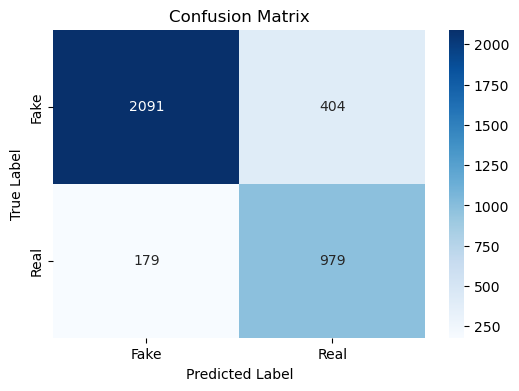

In [135]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Original Confusion Matrix
conf_matrix = np.array(conf_matrix_array)

# Remove the second row (index 1) and the second column (index 1)
new_conf_matrix = np.delete(conf_matrix, 1, axis=0)  # Remove row
new_conf_matrix = np.delete(new_conf_matrix, 1, axis=1)  # Remove column

print("micro F1-score: " + str(f1_score(y_test, svm_predictions, average='micro')))
print("macro F1-score: " + str(f1_score(y_test, svm_predictions, average='macro')))
# Plot the confusion matrix as a heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(new_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Fake', 'Real'], yticklabels=['Fake', 'Real'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()